# Human Fall Detection

<a align="left" href="https://ultralytics.com/yolov5" target="_blank">
<img width="1024", src="https://user-images.githubusercontent.com/26833433/125273437-35b3fc00-e30d-11eb-9079-46f313325424.png"></a>

# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅


# 1. Inference

`detect.py` runs YOLOv5 inference on a variety of sources, downloading models automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases), and saving results to `runs/detect`. Example inference sources are:

```shell
python detect.py --source 0  # webcam
                          img.jpg  # image 
                          vid.mp4  # video
                          path/  # directory
                          path/*.jpg  # glob
                          'https://youtu.be/Zgi9g1ksQHc'  # YouTube
                          'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

In [3]:
!unzip -q ../fall_dataset.zip -d../

# 2. Validate
Validate a model's accuracy on Fall Detetction val dataset. Models are downloaded automatically from the [latest YOLOv5 release](https://github.com/ultralytics/yolov5/releases).

# Fall Detection Dataset

Download [Fall Detection](https://www.kaggle.com/uttejkumarkandagatla/fall-detection-dataset) dataset (53MB - 500 images), and test model accuracy.

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

# Train YOLOv5s on Custom Dataset for 50 epochs

In [5]:
!python train.py --img 640 --batch 16 --epochs 20 --data custom_data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=custom_data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=20, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, 

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Experiment 1

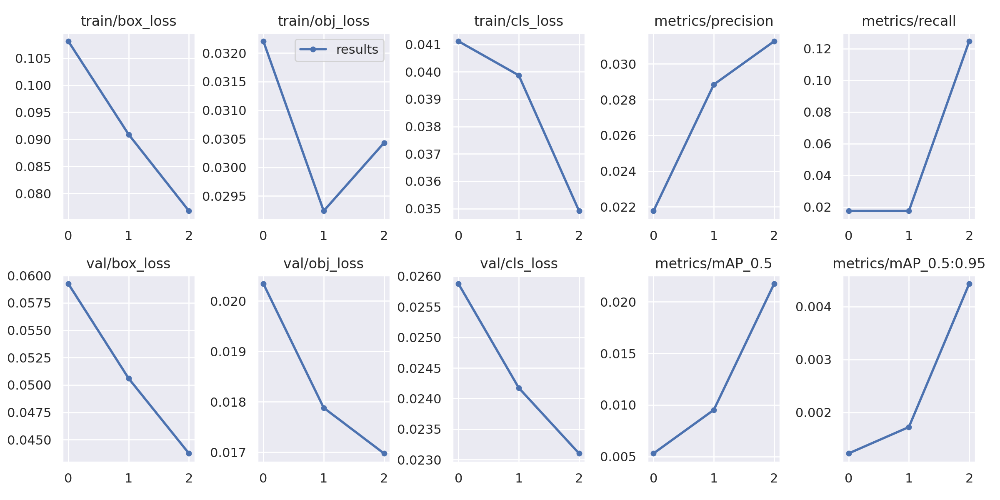

In [14]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from IPython.display import Image
Image(filename='/content/yolov5/runs/train/exp/results.png',width=1000) 

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in YOLOv5

# Experiment 2

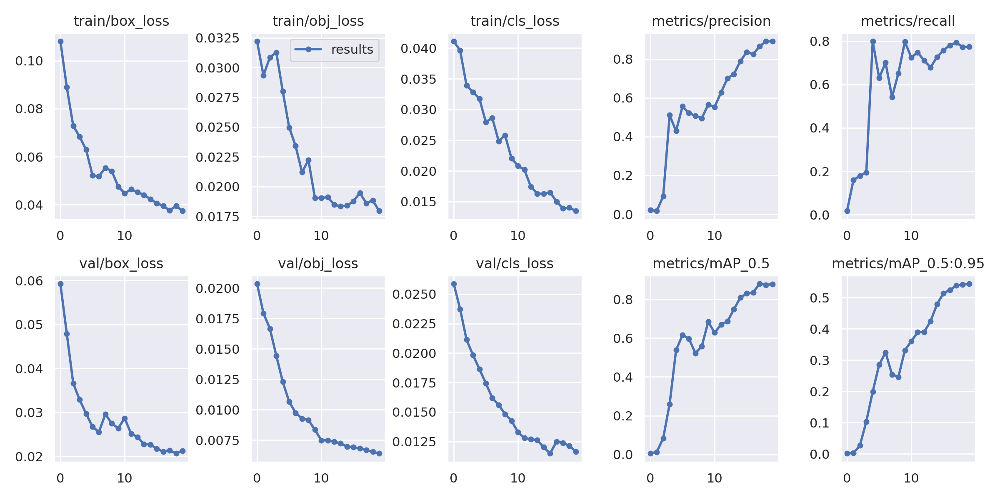

In [21]:
Image(filename='/content/yolov5/runs/train/exp2/results.png',width=1000) 

# Training and Testing for 3 Batches

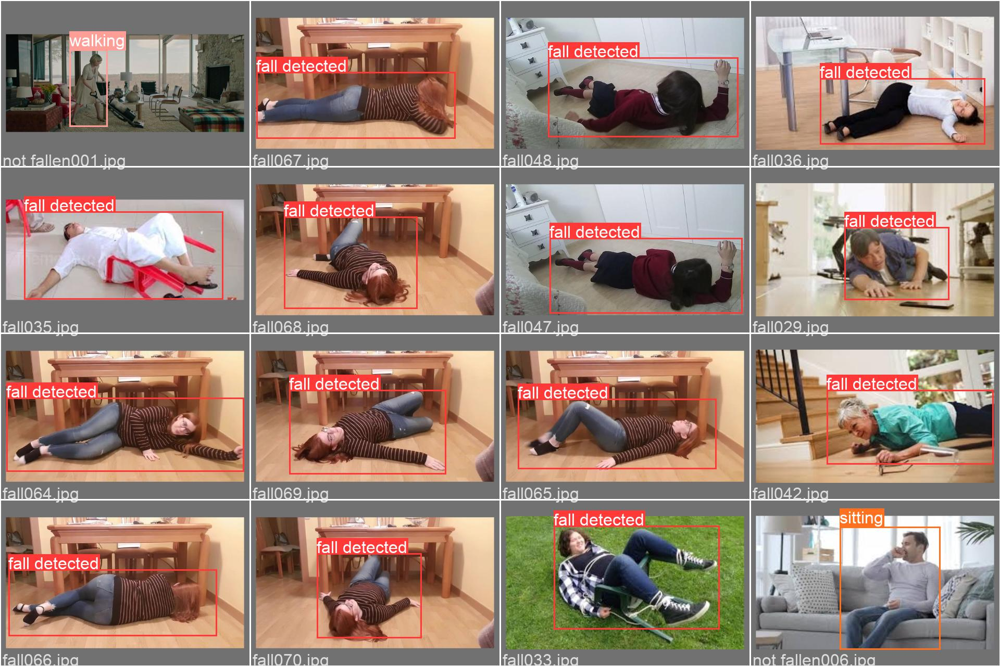

In [22]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch0_labels.jpg',width=1000) 

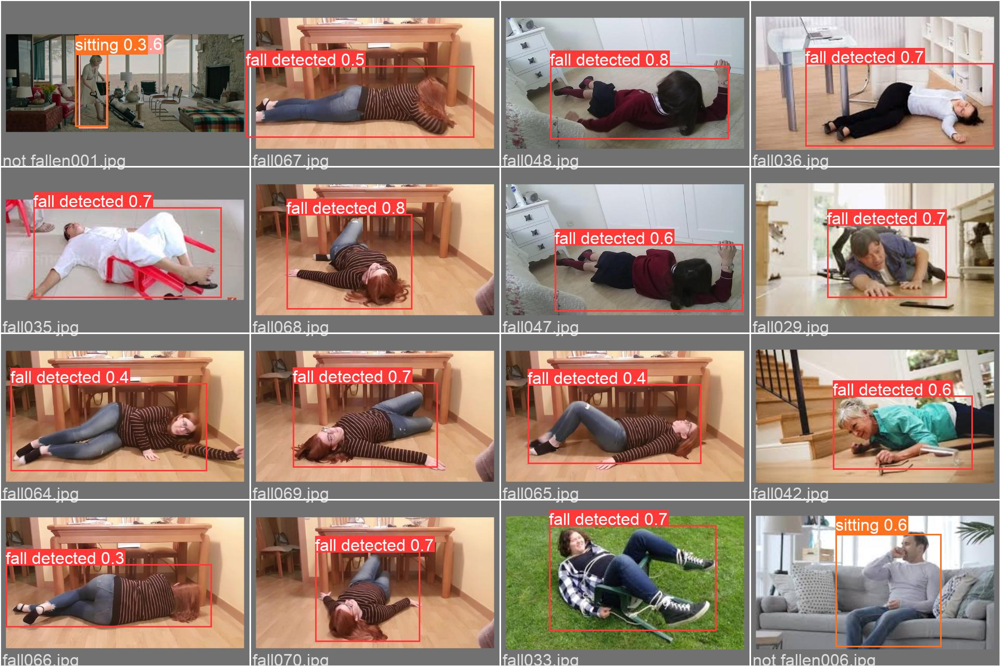

In [23]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch0_pred.jpg',width=1000) 

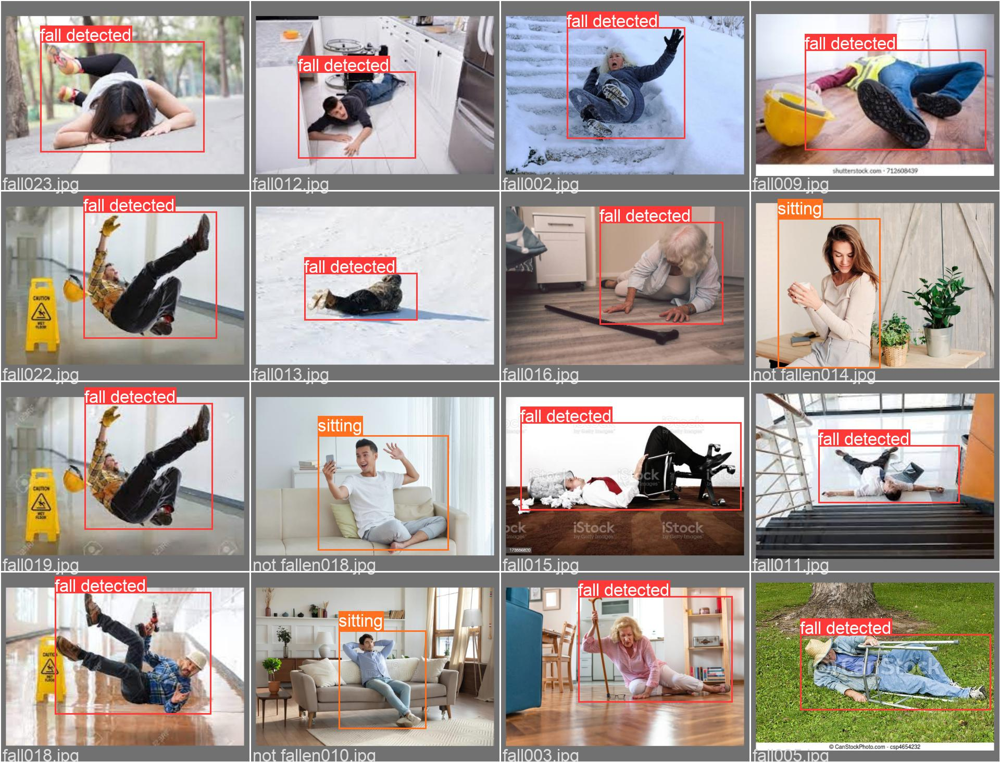

In [24]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch1_labels.jpg',width=1000) 

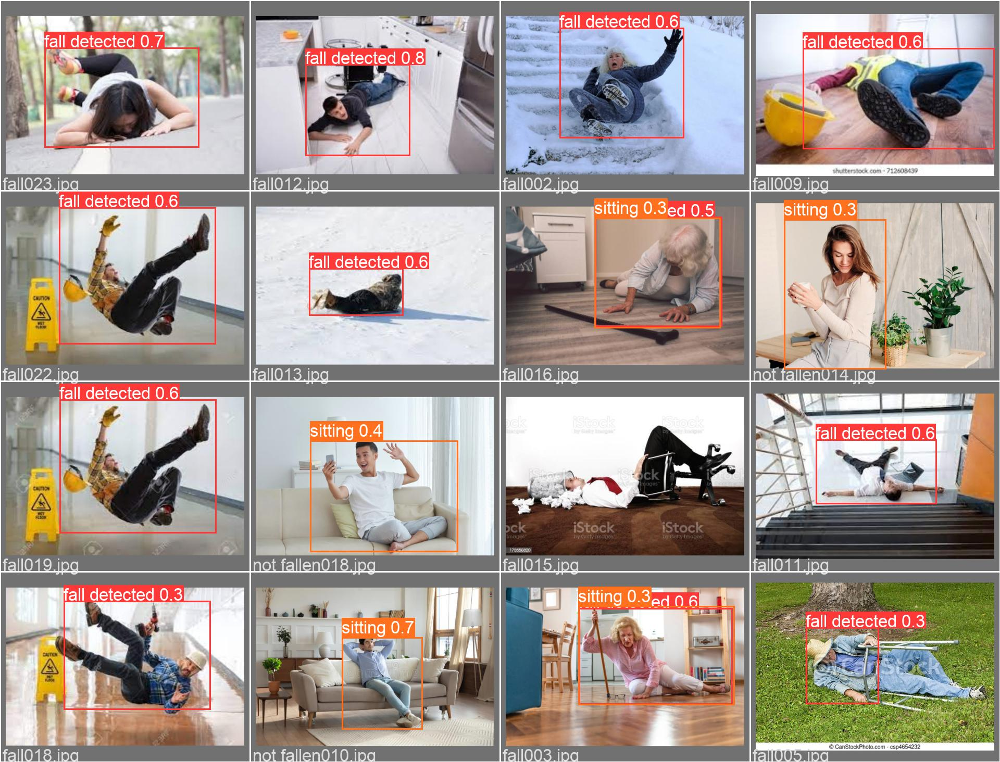

In [25]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch1_pred.jpg',width=1000) 

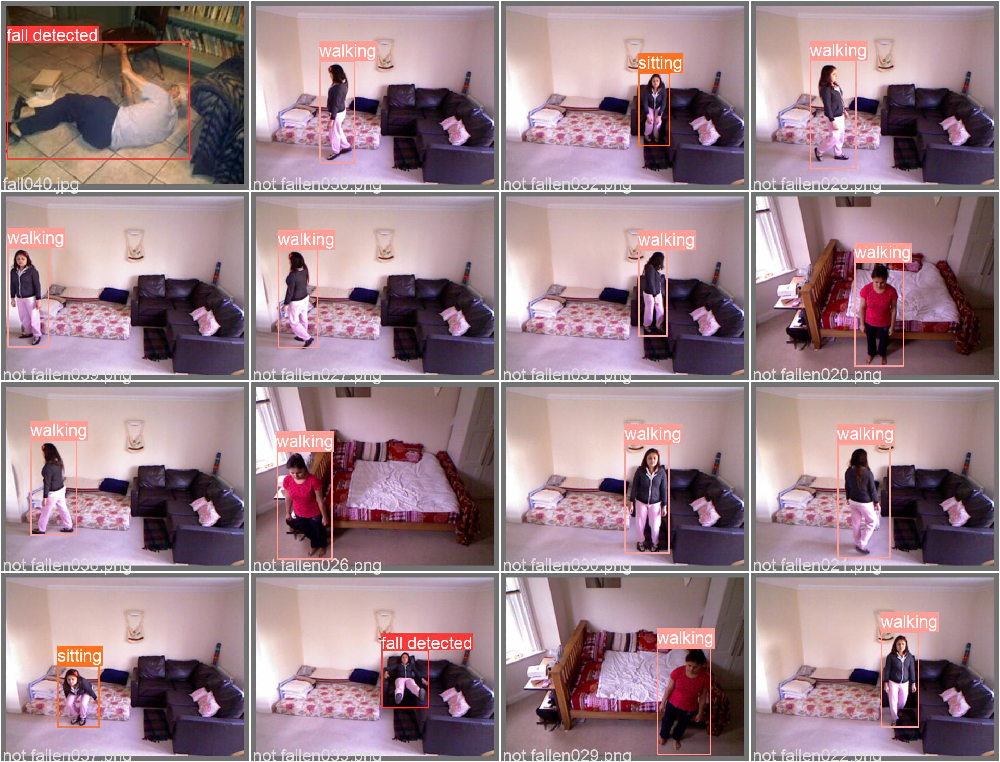

In [26]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch2_labels.jpg',width=1000) 

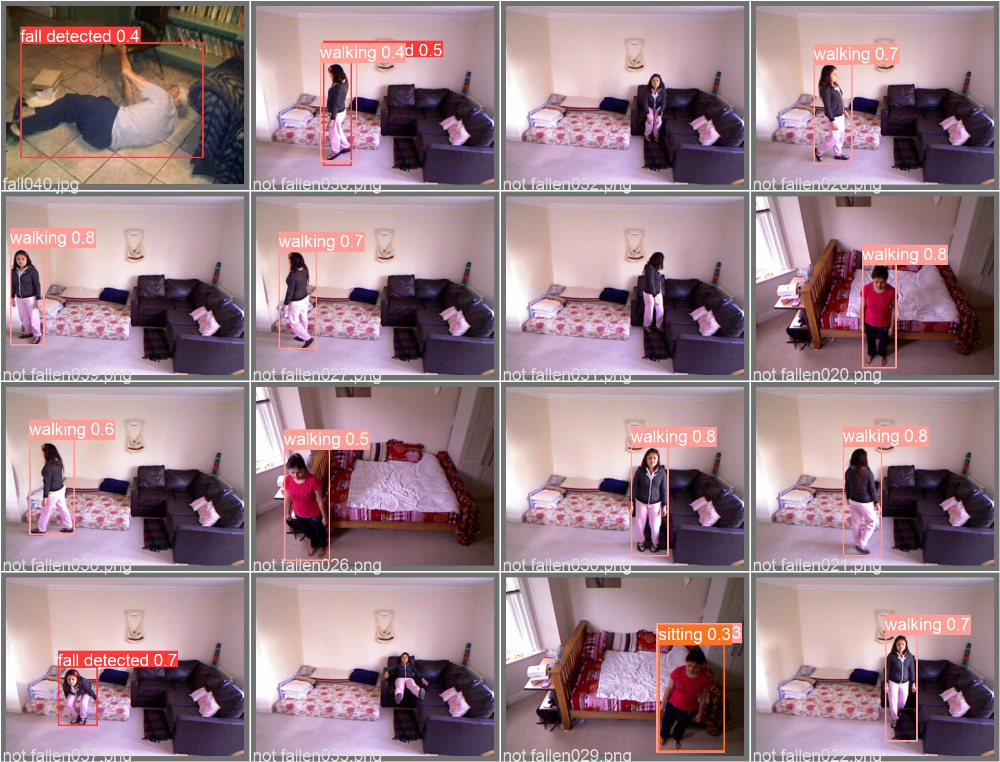

In [27]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch2_pred.jpg',width=1000) 

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder.

In [29]:
%ls runs/train/exp2/weights

best.pt  last.pt


In [31]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.25 --source ../fall_detection_1.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=../fall_detection_1.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/180) /content/fall_detection_1.mp4: 384x640 1 walking, Done. (0.029s)
video 1/1 (2/180) /content/fall_detection_1.mp4: 384x640 1 walking, Done. (0.027s)
video 1/1 (3/180) /content/fall_detection_1.mp4: 384x640 1 walking, Done. (0.027s)
video 1/1 (4/180) /content/fall_detection_1.mp4: 384x640 1 walking, Done. (0.027s)
video 1/1 (5/180) /content/fall_detection_1.mp4: 384x640 1 w

In [43]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.25 --source ../fall_detection_2.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=../fall_detection_2.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/600) /content/fall_detection_2.mp4: 640x640 1 fall detected, Done. (0.033s)
video 1/1 (2/600) /content/fall_detection_2.mp4: 640x640 1 fall detected, Done. (0.034s)
video 1/1 (3/600) /content/fall_detection_2.mp4: 640x640 Done. (0.033s)
video 1/1 (4/600) /content/fall_detection_2.mp4: 640x640 Done. (0.034s)
video 1/1 (5/600) /content/fall_detection_2.mp4: 640x640 Done. (0.034s

In [44]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.25 --source ../fall_detection_3.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=../fall_detection_3.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1563) /content/fall_detection_3.mp4: 448x640 1 fall detected, Done. (0.031s)
video 1/1 (2/1563) /content/fall_detection_3.mp4: 448x640 1 fall detected, Done. (0.028s)
video 1/1 (3/1563) /content/fall_detection_3.mp4: 448x640 1 fall detected, Done. (0.028s)
video 1/1 (4/1563) /content/fall_detection_3.mp4: 448x640 1 fall detected, Done. (0.028s)
video 1/1 (5/1563) /content/fall

In [45]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.25 --source ../fall_detection_4.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=../fall_detection_4.mp4, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1346) /content/fall_detection_4.mp4: 640x640 1 fall detected, Done. (0.034s)
video 1/1 (2/1346) /content/fall_detection_4.mp4: 640x640 1 fall detected, Done. (0.034s)
video 1/1 (3/1346) /content/fall_detection_4.mp4: 640x640 1 fall detected, Done. (0.034s)
video 1/1 (4/1346) /content/fall_detection_4.mp4: 640x640 1 fall detected, Done. (0.032s)
video 1/1 (5/1346) /content/fall

In [ ]:
!python detect.py --weights yolov5falldetection.pt --img 640 --conf 0.25 --source ./Input_videos/fall_detection_4.mp4

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [46]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [50]:
%cp /content/yolov5/runs/detect/exp2/fall_detection_1.mp4 /content/gdrive/My\ Drive

In [52]:
%cp /content/yolov5/runs/detect/exp3/fall_detection_2.mp4 /content/gdrive/My\ Drive

In [53]:
%cp /content/yolov5/runs/detect/exp4/fall_detection_3.mp4 /content/gdrive/My\ Drive

In [54]:
%cp /content/yolov5/runs/detect/exp5/fall_detection_4.mp4 /content/gdrive/My\ Drive

In [47]:
%cp /content/yolov5/runs/train/exp2/weights/best.pt /content/gdrive/My\ Drive